## Homework 2: Canny edge detector

## Tarun Sharma
## ts5098


**Release date:** Feb 21st 2025

**Due date:** Mar 6th 2025

The goal of the assignment is to implement a Canny edge detector. You should return the completed notebook, including answers and illustrations. 

If you are using [anaconda](https://www.anaconda.com/distribution/) you will have necessary libraries, if not, you may need to install them.

**Load and visualize image**

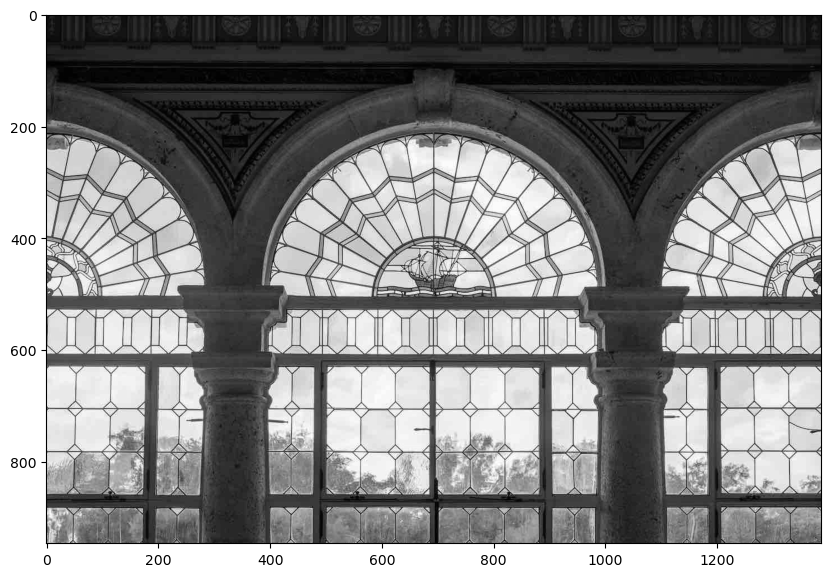

In [34]:
import numpy as np 
import matplotlib.pyplot as plt 
%matplotlib inline 
import scipy.ndimage as ndimage #image processing library

# by default, the grayscale images are displayed with the jet colormap: use grayscale instead
plt.rcParams['image.cmap'] = 'gray'  

def rgb2gray(rgb):
    r, g, b = rgb[:,:,0], rgb[:,:,1], rgb[:,:,2]
    gray = 0.2989 * r + 0.5870 * g + 0.1140 * b
    return gray

name = 'example_image.jpg'
img = plt.imread(name)
img = rgb2gray(img)
plt.figure(figsize=(10,10)) # this allows you to control the size of the displayed image
plt.imshow(img)

**Detailed instructions:**

a- Compute a binary image corresponding to thresholding the norm of the gradient. You may use the function `ndimage.gaussian_filter` to compute the derivative of gaussian filter (see [docs](https://docs.scipy.org/doc/scipy/reference/generated/scipy.ndimage.gaussian_filter.html)). Discuss the parameters (there are two) and their influence on the results.

In [35]:
#TODO: Implement a function to compute gradient
def compute_gradient(image, sigma=1.0):
    """
    Calculate the gradient magnitude and angle of an image.
    
    Parameters:
      image: Input grayscale image.
      sigma: Standard deviation for Gaussian smoothing. A larger sigma reduces noise but can blur details.
    
    Returns:
      g_norm: The magnitude of the gradient at each pixel.
      g_theta: The gradient direction at each pixel in degrees (ranging from 0 to 180).
    """
    # Smooth the image and compute the derivative in the x-direction and y-direction.
    grad_x = ndimage.gaussian_filter(image, sigma=sigma, order=(0, 1))
    
    grad_y = ndimage.gaussian_filter(image, sigma=sigma, order=(1, 0))
    
    # Calculate the gradient magnitude using the Euclidean distance 
    g_norm = np.hypot(grad_x, grad_y)
    
    # Calculate the gradient direction using arctan2 (which handles division by zero nicely)
    g_theta = np.arctan2(grad_y, grad_x) * (180.0 / np.pi)
    
    # Ensure all angle values fall between 0 and 180 degrees.
    g_theta[g_theta < 0] += 180

    return g_norm, g_theta


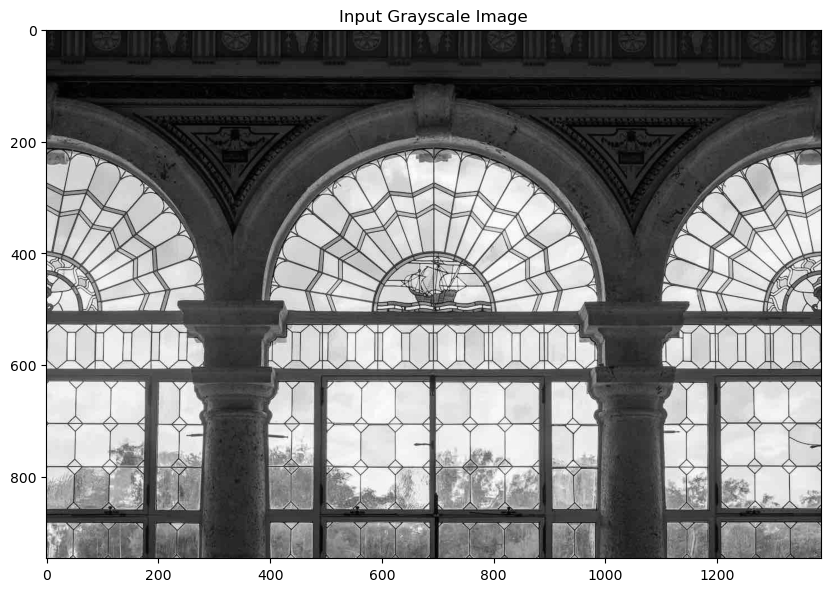

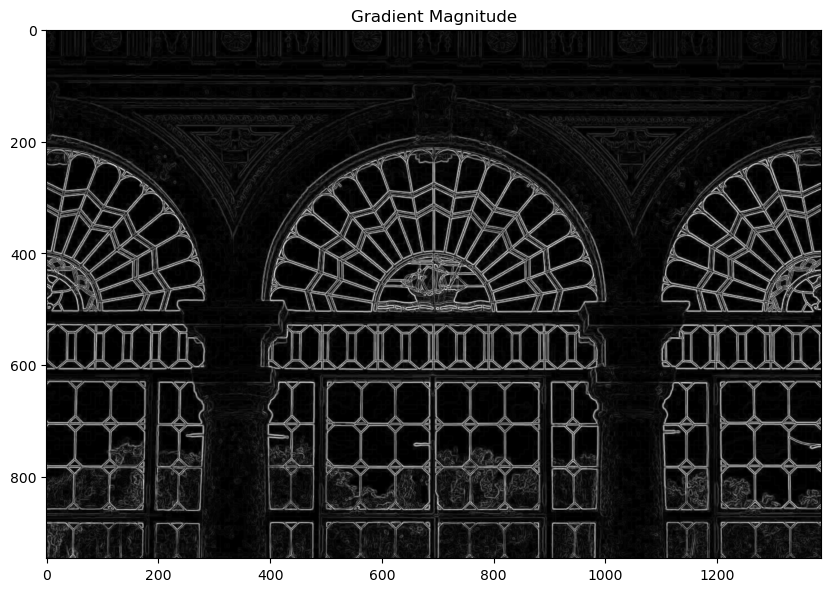

In [36]:

name = 'example_image.jpg'
img = plt.imread(name)
if img.ndim == 3:
    img = rgb2gray(img)
plt.figure(figsize=(10,10))
plt.imshow(img)
plt.title("Input Grayscale Image")
plt.show()

g_norm, g_theta = compute_gradient(img, sigma=1.0)
plt.figure(figsize=(10,10))
plt.imshow(g_norm)
plt.title("Gradient Magnitude")
plt.show()


b- Write a function `nms(g_norm,g_theta)` which takes as input the gradient norm and direction and outputs a binary image with value 1 only for pixels that correspond to a maximum in the direction of the gradient.

In [37]:
#TODO: Implement non-max suppresion in function nms(g_norm,g_theta)
def nms(g_norm, g_theta):
    """
    Perform non-maximum suppression to thin out the edges in the gradient image.
    
    Parameters:
      g_norm: The computed gradient magnitude for each pixel.
      g_theta: The gradient direction in degrees (ranging from 0 to 180).
      
    Returns: A binary image where pixels set to 1 indicate local maxima along the gradient direction.
    """
    height, width = g_norm.shape
    
    # array with zeros to hold the suppression results.
    suppressed = np.zeros((height, width), dtype=np.float32)
    
    # Pad the image with a border of zeros
    padded_grad = np.pad(g_norm, ((1, 1), (1, 1)), mode='constant', constant_values=0)
    
    # Loop through each pixel in the original image (skip the padded border).
    for i in range(1, height + 1):
        for j in range(1, width + 1):
            # Extract the gradient angle for the current pixel.
            angle = g_theta[i - 1, j - 1]
            
            # Depending on the gradient angle, select the appropriate neighbors.
            # This divides the full circle into four sectors.
            if (0 <= angle < 22.5) or (157.5 <= angle <= 180):
                # When the edge is horizontal, compare with left and right neighbors.
                neighbor1 = padded_grad[i, j - 1]
                neighbor2 = padded_grad[i, j + 1]
            elif 22.5 <= angle < 67.5:
                # For a diagonal edge (from bottom left to top right), compare with top-right and bottom-left.
                neighbor1 = padded_grad[i - 1, j + 1]
                neighbor2 = padded_grad[i + 1, j - 1]
            elif 67.5 <= angle < 112.5:
                # For a vertical edge, check the pixel above and below.
                neighbor1 = padded_grad[i - 1, j]
                neighbor2 = padded_grad[i + 1, j]
            elif 112.5 <= angle < 157.5:
                # For the other diagonal (top left to bottom right), compare with top-left and bottom-right.
                neighbor1 = padded_grad[i - 1, j - 1]
                neighbor2 = padded_grad[i + 1, j + 1]
            
            if padded_grad[i, j] >= neighbor1 and padded_grad[i, j] >= neighbor2:
                suppressed[i - 1, j - 1] = padded_grad[i, j]
            else:
                suppressed[i - 1, j - 1] = 0
    
    # Convert the suppressed result into a binary edge map:
    binary_edges = (suppressed > 0).astype(np.uint8)
    return binary_edges


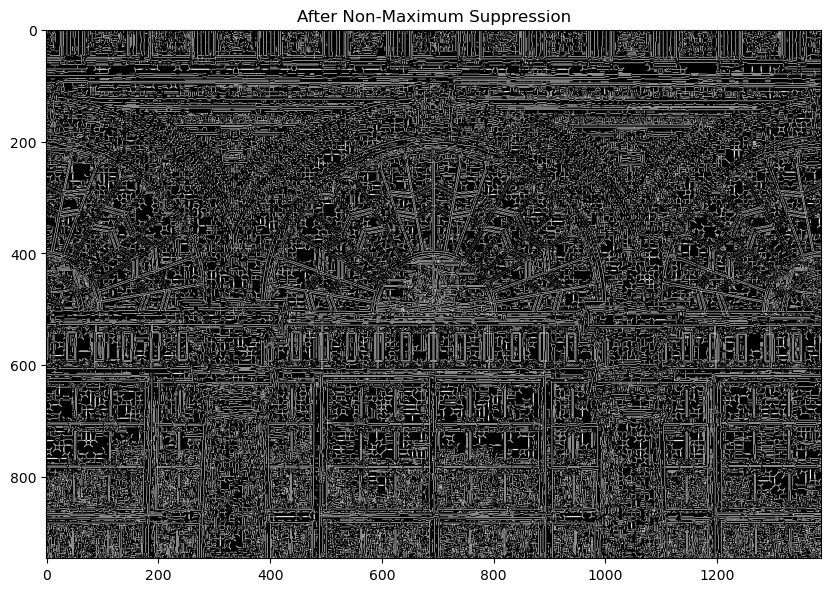

In [38]:

nms_result = nms(g_norm, g_theta)
plt.figure(figsize=(10,10))
plt.imshow(nms_result)
plt.title("After Non-Maximum Suppression")
plt.show()

c- Combine step 'a' and 'b' to extract edges with a gradient norm larger than a given threshold.

In [39]:
#TODO: Implement a function to extract edges given threshold

def extract_edges(image, sigma=1.0, thresh=20):
    """
    Identify edge locations in an image using gradient calculation, thinning via non-maximum suppression, 
    and a threshold to decide which edges to keep.
    
    Parameters:
      image: The input grayscale image.
      sigma: Controls the amount of Gaussian smoothing to reduce noise.
      thresh: The threshold value; pixels with gradient magnitudes higher than this are considered edges.
    
    Returns: A binary image where '1' indicates an edge and '0' means no edge.
    """
    grad_magnitude, grad_angle = compute_gradient(image, sigma=sigma)
    
    # thin the edges by keeping only local peaks
    thinned_edges = nms(grad_magnitude, grad_angle)
    
    # mark our detected edges
    binary_edges = np.zeros_like(thinned_edges, dtype=np.uint8)
    
    binary_edges[(thinned_edges == 1) & (grad_magnitude > thresh)] = 1
    
    return binary_edges


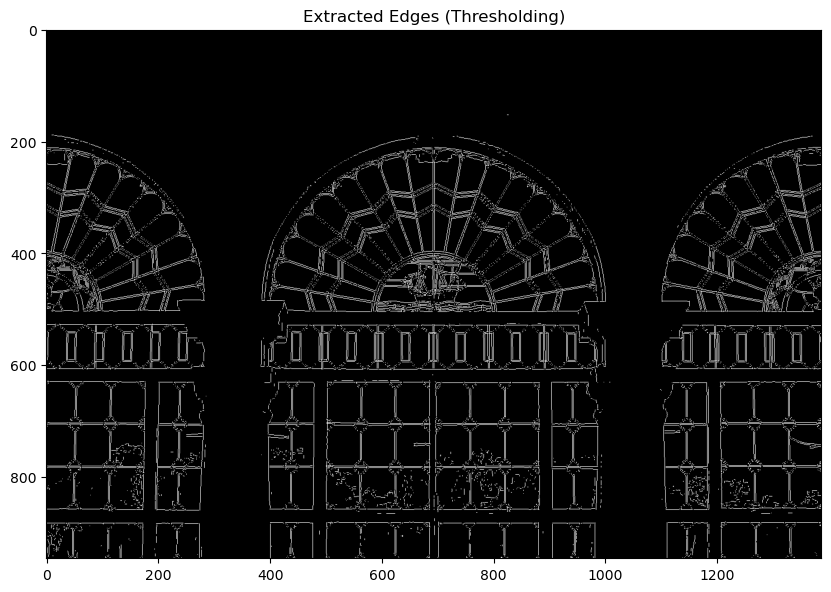

In [40]:
edges = extract_edges(img, sigma=1.0, thresh=20)
plt.figure(figsize=(10,10))
plt.imshow(edges)
plt.title("Extracted Edges (Thresholding)")
plt.show()

d- Add the hysteresis thresholding to step 'c' to implement a function computing the Canny edges.

Here is one way to do the hysteresis thresholding. Apply step 'c' with two thresholds $t_1 < t_2$. This yields a set of "strong pixels" (large threshold) and "weak pixels" (small threshold). Initialize a list of edge pixels by including only the set of strong pixels. For each pixel in this list, check if its neighboors are weak pixels. If they are, add them to the list of pixels to visit.

In [41]:
#TODO: Implement hysteresis thresholding in a function
def canny_edge_detector(image, sigma=1.0, low_thresh=10, high_thresh=20):
    """
    Apply the Canny edge detection algorithm using hysteresis thresholding.
    
    Parameters:
      image: Input grayscale image.
      sigma: Standard deviation for Gaussian smoothing. A larger sigma smooths out noise but might blur details.
      low_thresh: The lower limit for weak edges.
      high_thresh: The upper limit that defines strong edges.
      
    Returns: A binary image where detected edges are marked with 1.
    """
    grad_mag, grad_dir = compute_gradient(image, sigma=sigma)
    
    # Thin the edges by keeping only local maximum pixels in the gradient direction
    thin_edges = nms(grad_mag, grad_dir)
    
    # Classify pixels into strong and weak edges based on gradient values
    strong_mask = (grad_mag >= high_thresh)
    weak_mask = ((grad_mag >= low_thresh) & (grad_mag < high_thresh))
    
    # Start by marking pixels as edges if they are strong and are confirmed by non-maximum suppression
    edge_map = np.zeros_like(grad_mag, dtype=np.uint8)
    edge_map[strong_mask & (thin_edges == 1)] = 1
    
    # Now, perform edge tracking via hysteresis and find the image dimensions.
    rows, cols = image.shape
    strong_coords = list(zip(*np.where(edge_map == 1)))
    
    # Define relative neighbor coordinates for 8-connected neighborhood
    neighbor_offsets = [(-1, -1), (-1, 0), (-1, 1),
                        (0, -1),           (0, 1),
                        (1, -1),  (1, 0),  (1, 1)]
    
    # Process each strong edge pixel to see if any weak edges are connected and look at each neighbor around the current pixel
    while strong_coords:
        cur_row, cur_col = strong_coords.pop()
        for d_row, d_col in neighbor_offsets:
            new_row, new_col = cur_row + d_row, cur_col + d_col

            # Check if the neighbor lies within the image boundaries
            if 0 <= new_row < rows and 0 <= new_col < cols:
                # If the neighbor qualifies as a weak edge and is also a local maximum,
                # and hasn't been marked as an edge yet, then add it.
                if weak_mask[new_row, new_col] and thin_edges[new_row, new_col] == 1 and edge_map[new_row, new_col] == 0:
                    edge_map[new_row, new_col] = 1
                    strong_coords.append((new_row, new_col))
    
    return edge_map




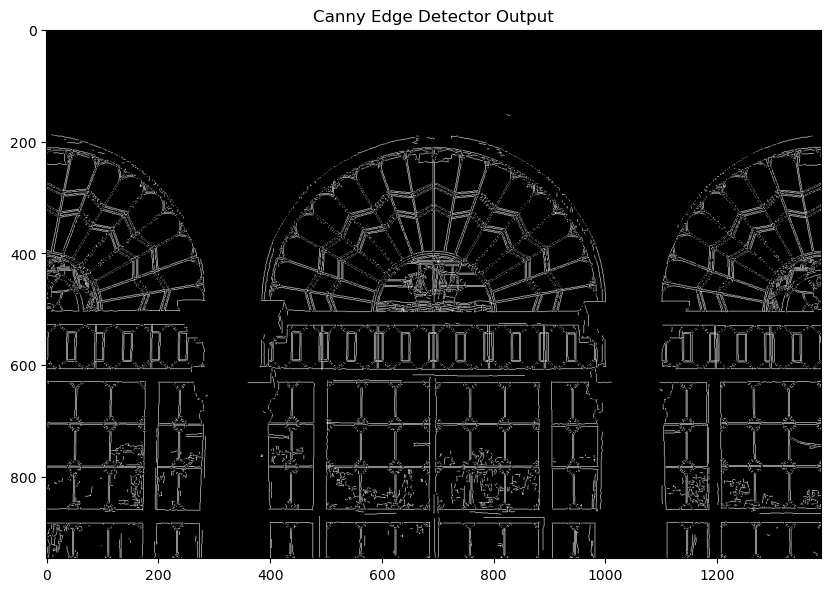

In [42]:
canny_edges = canny_edge_detector(img, sigma=1.0, low_thresh=10, high_thresh=20)
plt.figure(figsize=(10,10))
plt.imshow(canny_edges)
plt.title("Canny Edge Detector Output")
plt.show()

e- Run your code on at least four images of your own choosing. Use different parameters and comment on their effects.

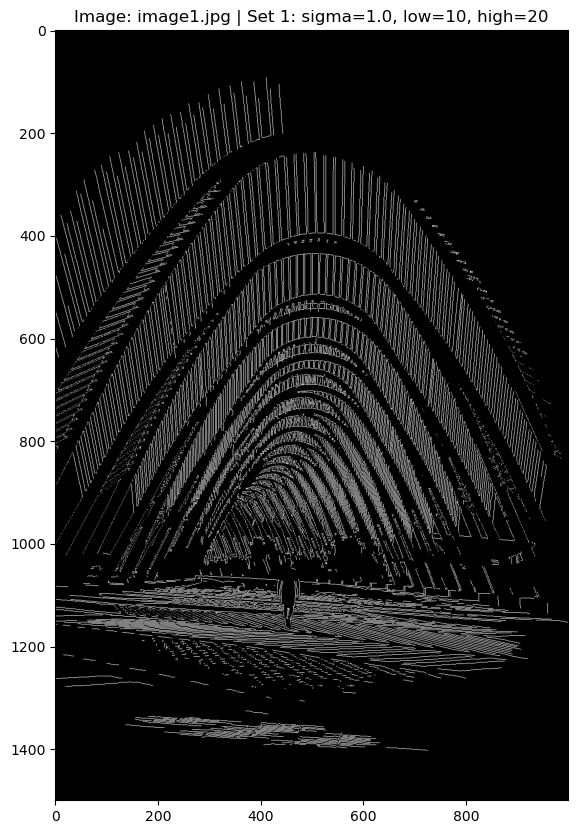

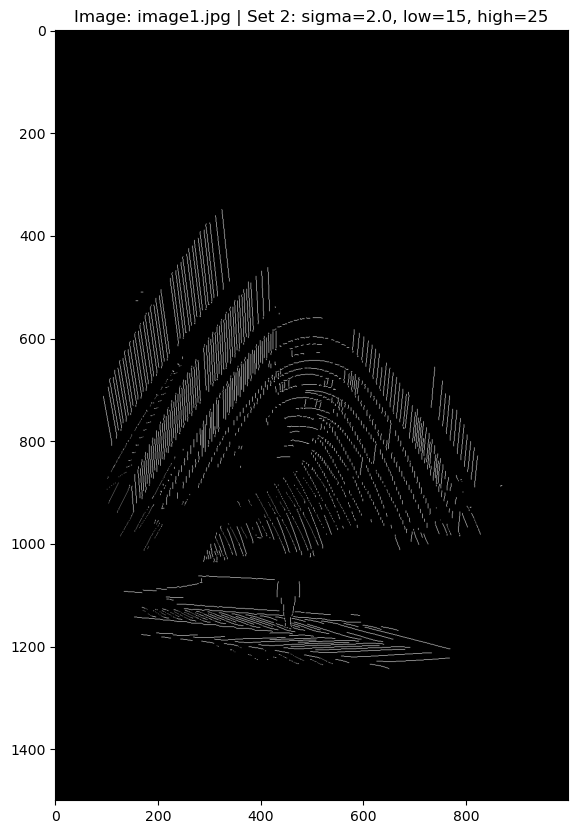

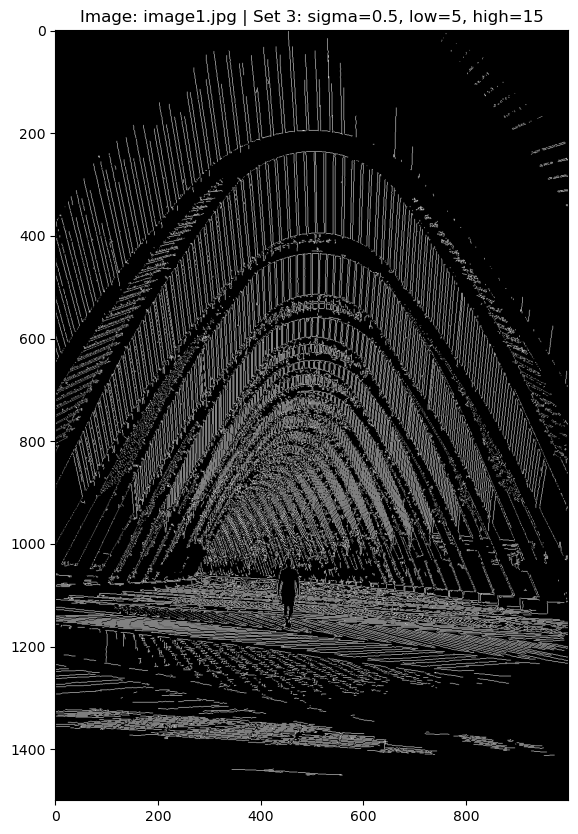

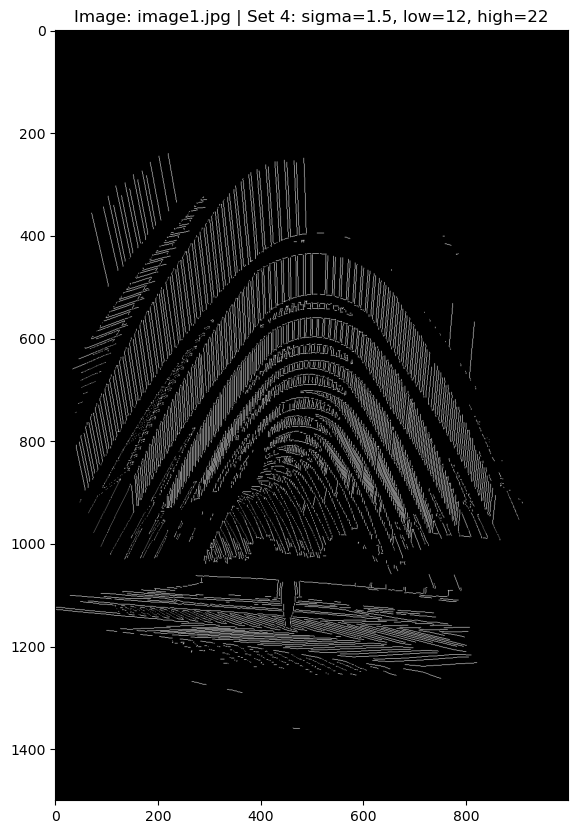

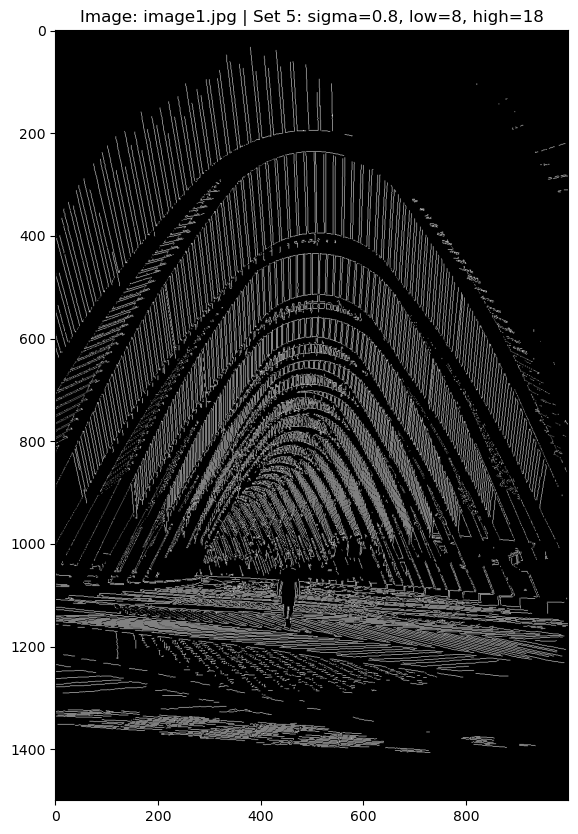

...

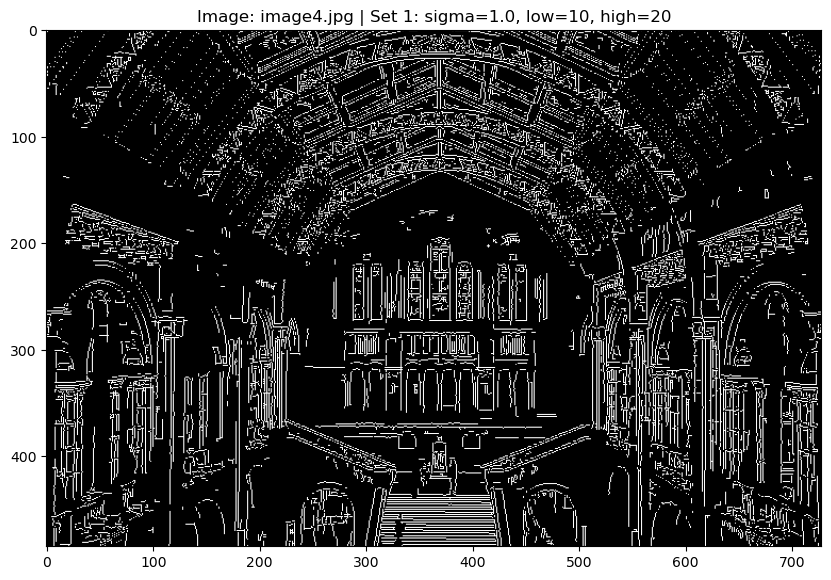

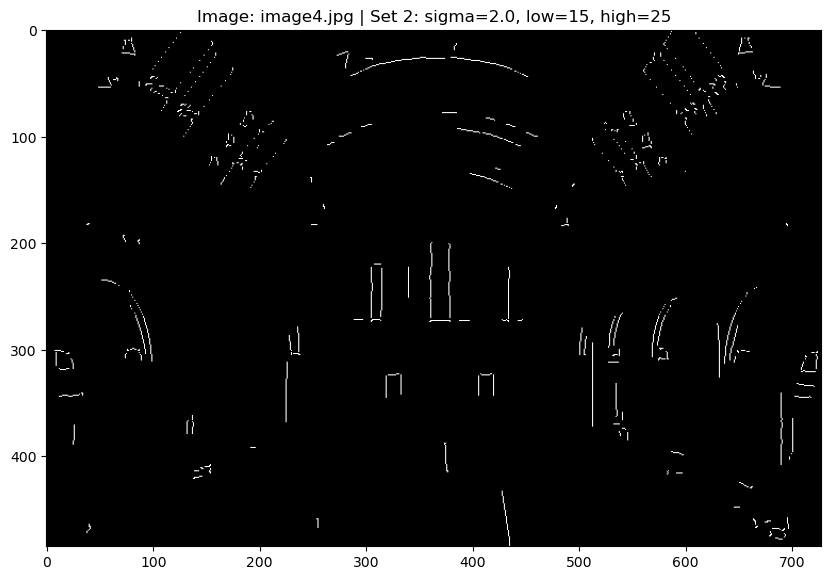

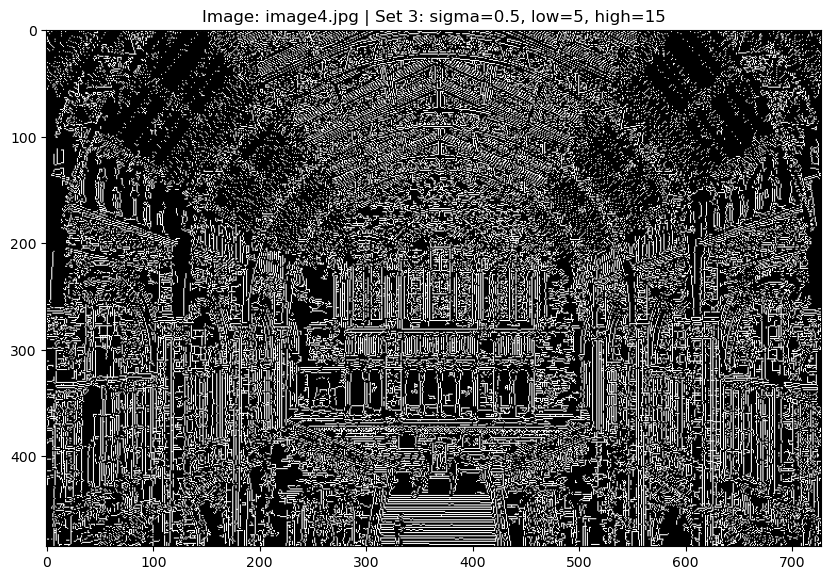

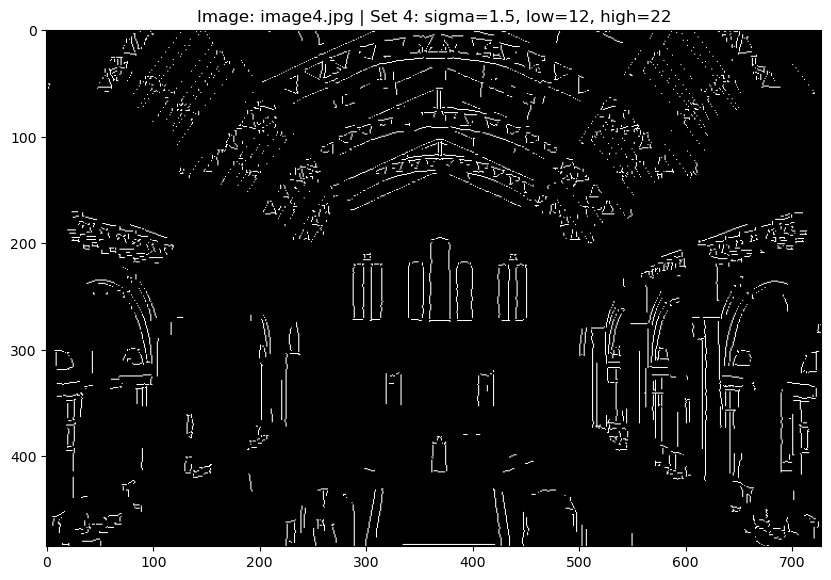

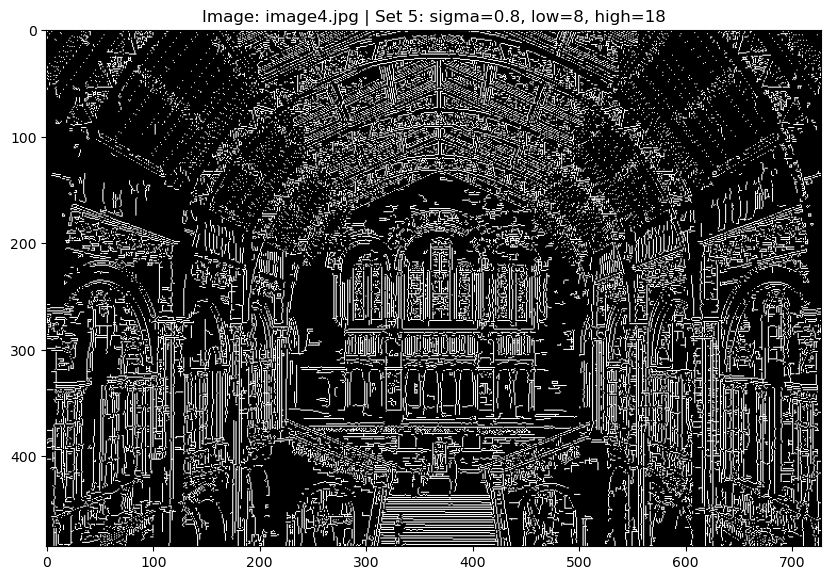

In [45]:
#TODO: Experiment on at least four other images with different parameters

# image_files = ['image1.jpg', 'image2.jpg', 'image3.jpg', 'image4.jpg']

# # Parameters to experiment with
# params = [
#     {'sigma': 1.0, 'low_threshold': 10, 'high_threshold': 20},
#     {'sigma': 2.0, 'low_threshold': 15, 'high_threshold': 20},
#     {'sigma': 1.0, 'low_threshold': 5,  'high_threshold': 15},
#     {'sigma': 0.5, 'low_threshold': 10, 'high_threshold': 25}
# ]

# for fname, par in zip(image_files, params):
#     try:
#         # Load image and convert to grayscale if needed.
#         im = plt.imread(fname)
#         if im.ndim == 3:
#             im = rgb2gray(im)
            
#         # Apply Canny edge detector.
#         edges_out = canny_edge_detector(im, sigma=par['sigma'],
#                                         low_thresh=par['low_threshold'],
#                                         high_thresh=par['high_threshold'])
#         # Display the results.
#         plt.figure(figsize=(10,10))
#         plt.imshow(edges_out)
#         plt.title(f"Edges for {fname}\nParameters: sigma={par['sigma']}, low={par['low_threshold']}, high={par['high_threshold']}")
#         plt.show()
#     except FileNotFoundError:
#         print(f"Image file {fname} not found. Please check the file path.")

# List of image filenames (replace these with your actual file paths)
image_files = ['image1.jpg', 'image2.jpg', 'image3.jpg', 'image4.jpg']

# Define multiple parameter sets to test on each image.
# Each dictionary represents a different combination of sigma, low, and high thresholds.
param_sets = [
     {'sigma': 1.0, 'low_threshold': 10, 'high_threshold': 20},
    {'sigma': 2.0, 'low_threshold': 15, 'high_threshold': 25},
    {'sigma': 0.5, 'low_threshold': 5,  'high_threshold': 15},
    {'sigma': 1.5, 'low_threshold': 12, 'high_threshold': 22},
    {'sigma': 0.8, 'low_threshold': 8,  'high_threshold': 18}
]

# Loop through each image in our list.
for image_file in image_files:
    try:
        # Read the image file.
        img_data = plt.imread(image_file)
        # If the image has multiple channels, convert it to grayscale.
        if img_data.ndim == 3:
            img_data = rgb2gray(img_data)
        
        # Now, for this single image, test out multiple parameter sets.
        for idx, params in enumerate(param_sets, 1):
            # Apply the Canny edge detector with the current parameter set.
            detected_edges = canny_edge_detector(img_data, sigma=params['sigma'],
                                                 low_thresh=params['low_threshold'],
                                                 high_thresh=params['high_threshold'])
            
            # Show the result along with a title that explains the parameters used.
            plt.figure(figsize=(10, 10))
            plt.imshow(detected_edges)
            plt.title(f"Image: {image_file} | Set {idx}: sigma={params['sigma']}, "
                      f"low={params['low_threshold']}, high={params['high_threshold']}")
            plt.show()
    except FileNotFoundError:
        print(f"Image file {image_file} not found. Please verify the path.")




## Discussion


- **Sigma:** We can think of sigma as the "blur factor." If you set sigma higher (say 2.0), the image gets smoother, which helps reduce noise. But the downside is that the edges become wider and some fine details might vanish. On the flip side, a lower sigma (like 0.5) keeps more details intact, although it can make the image noisier.

- **Thresholds:** 
  -  High Threshold: This value decides what counts as a "strong" edge. For example, if you set it to 30, only pixels with really high gradient values become strong edges. This often results in a cleaner edge map, but sometimes you might end up with broken edges because fewer pixels are strong enough.
  - Low Threshold: This value picks up the "weaker" edges. Setting it lower (for instance, 5) means you allow more pixels to be considered as potential edges. If these weak edge pixels are connected to strong ones, they help form a continuous line. However, setting it too low might also let in a lot of noise.

Experimenting with these parameters on different images shows that the optimal settings depend on the image’s noise level and the edge contrast. Adjusting these parameters is key to achieving the best balance between edge detection and noise reduction.


## Conclusion

In this notebook, we implemented a full Canny edge detector that includes gradient computation, non-maximum suppression, threshold-based edge extraction, and hysteresis thresholding. We also demonstrated how different parameter choices affect the results on various images.
